# <center> EDA of Air Quality index of Bangalore City </center>


### Applying ML algorithm 
* Linear Regression
* Lasso & Reidge Regression
* Decision Tree Regression
* KNN Regression
* Random Forest
* XGBoost Regression
* ANN algorithm




In [ ]:
# importing libraries

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import cross_val_score
%matplotlib inline

In [ ]:
import warnings
warnings.filterwarnings('ignore')

In [ ]:
df = pd.read_csv('Real_Combine.csv')
df

,T,TM,Tm,SLP,H,VV,V,VM,PM 2.5
0,7.4,9.8,4.8,1017.6,93.0,0.5,4.3,9.4,219.720833
1,7.8,12.7,4.4,1018.5,87.0,0.6,4.4,11.1,182.187500
2,6.7,13.4,2.4,1019.4,82.0,0.6,4.8,11.1,154.037500
3,8.6,15.5,3.3,1018.7,72.0,0.8,8.1,20.6,223.208333
4,12.4,20.9,4.4,1017.3,61.0,1.3,8.7,22.2,200.645833
...,...,...,...,...,...,...,...,...,...
1088,18.1,24.0,11.2,1015.4,56.0,1.8,15.9,25.9,288.416667
1089,17.8,25.0,10.7,1015.8,54.0,2.3,9.4,22.2,256.833333
1090,13.9,24.5,11.4,1015.0,95.0,0.6,8.7,14.8,169.000000
1091,16.3,23.0,9.8,1016.9,78.0,1.1,7.4,16.5,186.041667


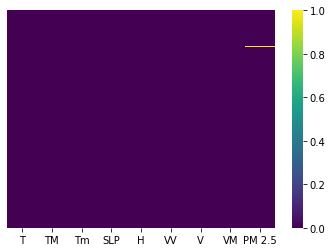

In [ ]:
sns.heatmap(df.isnull(), yticklabels=False, cbar=True, cmap='viridis')

In [ ]:
df.isnull().sum()

T         0
TM        0
Tm        0
SLP       0
H         0
VV        0
V         0
VM        0
PM 2.5    1
dtype: int64

> There are only 1 null values, which are present in PM2.5 column. This could be dropped 

In [ ]:
df.dropna(inplace=True)

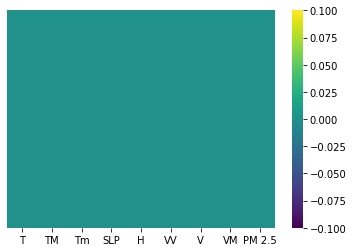

In [ ]:
sns.heatmap(df.isnull(), yticklabels=False, cbar=True, cmap='viridis')

>No more null values

#### Seperating dependent and independent features

In [ ]:
X = df.iloc[:,:-1]
y = df.iloc[:,-1]

### <center> Relationship between features using pairpolt </center>

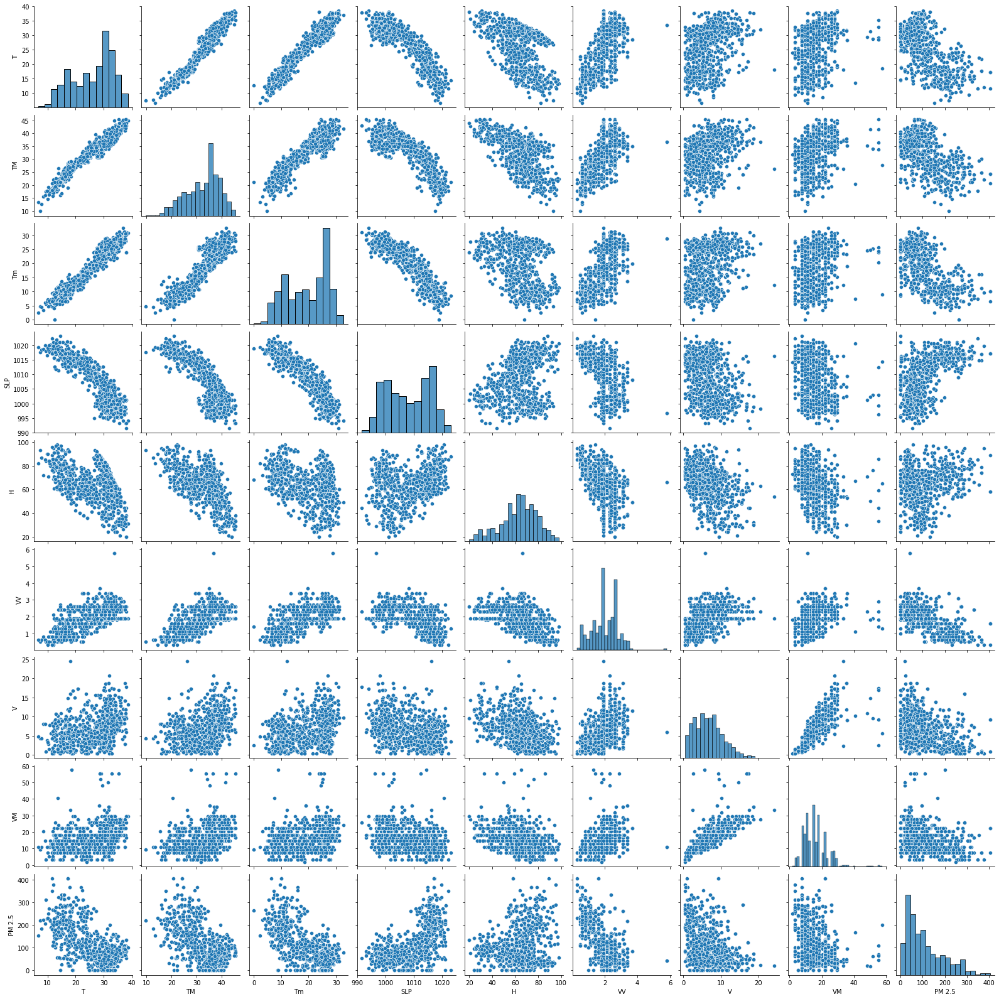

In [ ]:
sns.pairplot(df)

> As the ploints are scattered in such a way that, the best fit by linear reg model would be a Non-linear line. We would still try to implement for experimental purpose

### <center>Pearson correlation</center>

In [ ]:
df.corr()

,T,TM,Tm,SLP,H,VV,V,VM,PM 2.5
T,1.000000,0.967536,0.953719,-0.881409,-0.509299,0.640792,0.301994,0.287738,-0.631462
TM,0.967536,1.000000,0.892031,-0.822958,-0.586681,0.606945,0.292949,0.297011,-0.568409
Tm,0.953719,0.892031,1.000000,-0.917518,-0.287357,0.577240,0.296225,0.266782,-0.673824
SLP,-0.881409,-0.822958,-0.917518,1.000000,0.240256,-0.517915,-0.329838,-0.310704,0.623187
H,-0.509299,-0.586681,-0.287357,0.240256,1.000000,-0.465374,-0.380575,-0.362177,0.138005
VV,0.640792,0.606945,0.577240,-0.517915,-0.465374,1.000000,0.376873,0.342442,-0.573941
V,0.301994,0.292949,0.296225,-0.329838,-0.380575,0.376873,1.000000,0.775655,-0.268530
VM,0.287738,0.297011,0.266782,-0.310704,-0.362177,0.342442,0.775655,1.000000,-0.215854
PM 2.5,-0.631462,-0.568409,-0.673824,0.623187,0.138005,-0.573941,-0.268530,-0.215854,1.000000


>Here most of the features are having negative correlation (increase in one value of feature decrease the value of the target variable)

#### Corelation Heapmap

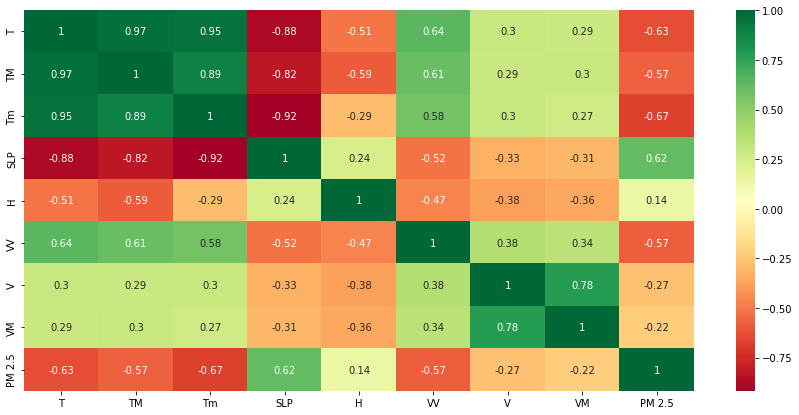

In [ ]:
plt.figure(figsize=(15,7))
sns.heatmap(df.corr(),annot=True, cmap='RdYlGn' )

### <center> Feature Importance </center>

Using Tree based Regressor to extract the top important features of the dataset


As we have only 7 features, we are not dropping features with low importance, For EDA purpose only

In [ ]:
from sklearn.ensemble import ExtraTreesRegressor

model = ExtraTreesRegressor()
model.fit(X,y)

ExtraTreesRegressor()

In [ ]:
print(model.feature_importances_*100)

[19.04623637  9.13690061 21.0821201  13.42150697  8.62494848 19.28260426
  5.2258289   4.17985432]


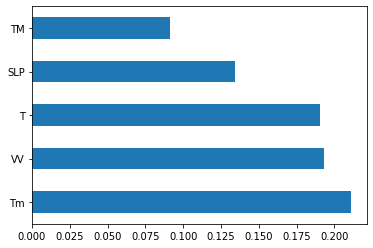

In [ ]:
feature_impt = pd.Series(model.feature_importances_, index=X.columns)
feature_impt.nlargest(5).plot(kind='barh')
plt.show()

From this barchart its clear that, the most important feature in <b>Tm</b>

#### Distplot

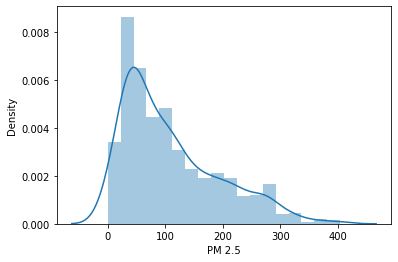

In [ ]:
sns.distplot(y)

Seems like it a right squeezed distribution. Shows how the output feature is distributed

# <center> Linear Regression </center> 

#### Train - Test - Split

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3)

In [ ]:
print(f'Train shape >> {len(X_train)}')
print(f'Test shape >> {len(X_test)}')

Train shape >> 764
Test shape >> 328


#### Model Creation

In [ ]:
from sklearn.linear_model import LinearRegression
model = LinearRegression()
model.fit(X_train, y_train)

LinearRegression()

In [ ]:
print(f'R^2 in train data>> {model.score(X_train,y_train)}')
print(f'R^2 in test data>> {model.score(X_test,y_test)}')

R^2 in train data>> 0.5380581680553099
R^2 in test data>> 0.5171354017759902


In [ ]:
score = cross_val_score(model, X,y,cv=5)

In [ ]:
score.mean()

0.4710569304807392

> We are getting 47% accuracy score using Linear Regression model 

#### Model Evaluation

In [ ]:
coef_df = pd.DataFrame(model.coef_,X.columns, columns=['Coefficient'])
coef_df

,Coefficient
T,-3.592645
TM,1.600528
Tm,-3.744617
SLP,-0.001233
H,-1.400061
VV,-43.157872
V,-2.070421
VM,0.416366


This tells us that,
holding all other features fixed, 1 unit increase in T is associated with decrease of 19.5 in AQI PM2.5

In [ ]:
pred = model.predict(X_test)

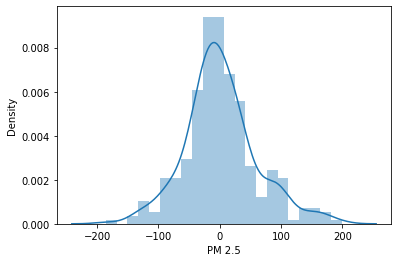

In [ ]:
sns.distplot(y_test-pred)

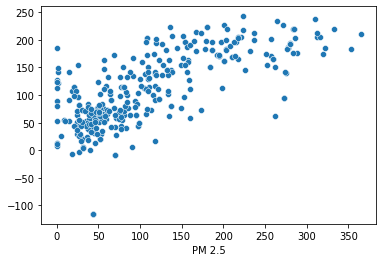

In [ ]:
sns.scatterplot(y_test,pred)

#### Error Evaluation

In [ ]:
from sklearn import metrics

In [ ]:
print('MAE > ', metrics.mean_absolute_error(y_test,pred))
print('MSE > ', metrics.mean_squared_error(y_test,pred))
print('RMSE > ', np.sqrt(metrics.mean_squared_error(y_test,pred)))

MAE >  43.81294350647022
MSE >  3515.391304975861
RMSE >  59.29073540592882


In [ ]:
print(f"R2 Score >> {np.round(metrics.r2_score(y_test,pred),2)*100} % ")

R2 Score >> 52.0 % 


The Linear regression model is giving <b>51% </b> accuracy

#### Exporting the  model in pickle file

In [ ]:
import pickle
file = open('LinearReg-model.pkl', 'wb')

pickle.dump(model, file)

## <center>  Comparing Linear, Ridge, Lasso Regression </center>

#### Linear Reg

In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import cross_val_score

In [ ]:
linear_reg = LinearRegression()
mse = cross_val_score(linear_reg, X, y, scoring='neg_mean_squared_error',cv=5)
print('Mean Square Error >>',np.mean(mse))

Mean Square Error >> -3686.201777339885


#### Ridge Reg

In [ ]:
from sklearn.linear_model import Ridge
from sklearn.model_selection import GridSearchCV

In [ ]:
ridge = Ridge()
paras = {'alpha':[1e-15,1e-10,1e-8,1e-3,1e-2,1,5,10,20,30,35,40]}
ridge_reg = GridSearchCV(ridge, paras,scoring='neg_mean_squared_error',cv=5)
ridge_reg.fit(X,y)

GridSearchCV(cv=5, estimator=Ridge(),
             param_grid={'alpha': [1e-15, 1e-10, 1e-08, 0.001, 0.01, 1, 5, 10,
                                   20, 30, 35, 40]},
             scoring='neg_mean_squared_error')

In [ ]:
print(ridge_reg.best_params_)
print(ridge_reg.best_score_)

{'alpha': 40}
-3664.364899607169


#### Lasso Reg

In [ ]:
from sklearn.linear_model import Lasso
from sklearn.model_selection import GridSearchCV

In [ ]:
lasso = Lasso()
paras = {'alpha':[1e-15,1e-10,1e-8,1e-3,1e-2,1,5,10,20,30,35,40]}
lasso_reg = GridSearchCV(lasso, paras,scoring='neg_mean_squared_error',cv=5)
lasso_reg.fit(X,y)

GridSearchCV(cv=5, estimator=Lasso(),
             param_grid={'alpha': [1e-15, 1e-10, 1e-08, 0.001, 0.01, 1, 5, 10,
                                   20, 30, 35, 40]},
             scoring='neg_mean_squared_error')

In [ ]:
print(lasso_reg.best_params_)
print(lasso_reg.best_score_)

{'alpha': 1}
-3666.78325343702


Lasso reg is suppose to perform better when the data set is huge. It removes not so important features while training and thus gives better accuracy. But in this case, very minute difference is showcases. 

> Lasso Reg is slighty better when compared, hence it is choosen 

#### Model Evaluation

In [ ]:
lasso_pred = lasso_reg.predict(X_test)

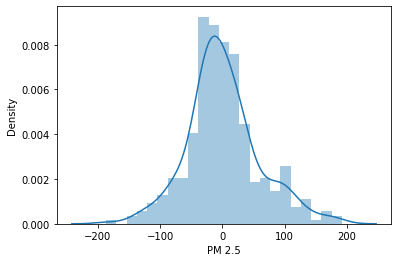

In [ ]:
sns.distplot(y_test-lasso_pred)

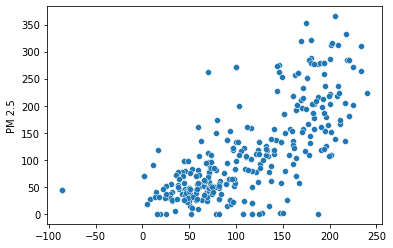

In [ ]:
sns.scatterplot(lasso_pred, y_test)

In [ ]:
print('MAE > ', metrics.mean_absolute_error(y_test,lasso_pred))
print('MSE > ', metrics.mean_squared_error(y_test,lasso_pred))
print('RMSE > ', np.sqrt(metrics.mean_squared_error(y_test,lasso_pred)))

MAE >  43.38730418181382
MSE >  3407.4445207877634
RMSE >  58.3733202823667


In [ ]:
print(f"R2 Score >> {np.round(metrics.r2_score(y_test,lasso_pred),3)*100} % ")

R2 Score >> 53.2 % 


The Lasso Regression model is giving <b>51%</b> Accuracy

#### Exporting the Lasso reg Model

In [ ]:
import pickle
file = open('LassoReg-model.pkl', 'wb')

pickle.dump(lasso_reg, file)

# <center> Decision Tree Regression </center>

In [ ]:
from sklearn.tree import DecisionTreeRegressor

In [ ]:
dtree = DecisionTreeRegressor(criterion='mse')
dtree.fit(X_train,y_train)

DecisionTreeRegressor(criterion='mse')

In [ ]:
print(f'R^2 on train data > {dtree.score(X_train,y_train)}')
print(f'R^2 on test data > {dtree.score(X_test,y_test)}')                 

R^2 on train data > 1.0
R^2 on test data > 0.6948176187254352


In [ ]:
dtree.score(X_test,y_test)

0.6948176187254352

In [ ]:
score = cross_val_score(dtree, X,y,cv=5)
print('Score >> ',score.mean())

Score >>  0.4395545816763395


> The decision Tree is giving an accuracy of <b>45%</b>. Seems like an overfitting case,due to 100% Train data Accuracy

### Tree visualization

In [ ]:

from IPython.display import Image
from six import StringIO
from sklearn.tree import export_graphviz
import pydotplus

In [ ]:
feature = ['T', 'TM', 'Tm', 'SLP', 'H', 'VV', 'V', 'VM']
len(feature)

8

In [ ]:
# import os
# os.environ['PATH'] = os.environ['PATH']+';'+ os.environ['CONDA_PREFIX']+R"\lIBRARY\BIN\GRAPHVIZ"

In [ ]:
dot_data = StringIO()
export_graphviz(dtree, out_file=dot_data, feature_names= feature, filled = True, rounded = True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png())

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.997686 to fit



In [ ]:
tree_pred = dtree.predict(X_test)

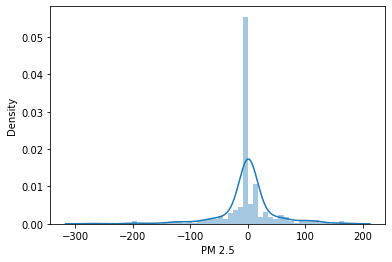

In [ ]:
sns.distplot(y_test-tree_pred)

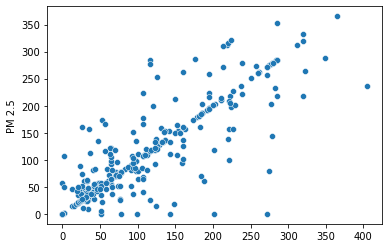

In [ ]:
sns.scatterplot(tree_pred, y_test)

### Hyperparameter Tuning for Decision Tree Regressor

In [ ]:
dtree = DecisionTreeRegressor()

In [ ]:
params = {
    'splitter':['best','random'],
    'max_depth':[3,4,5,6,8,10,12,15],
    'min_samples_leaf':[1,2,3,4,5],
    'min_weight_fraction_leaf':[0.1,0.2,0.3,0.4],
    'max_features':["auto",'log2','sqrt',None],
    'max_leaf_nodes':[None,10,20,30,40,50,60,70]
}

In [ ]:
from sklearn.model_selection import GridSearchCV

In [ ]:
random_search = GridSearchCV(dtree,param_grid=params, scoring='neg_mean_squared_error',n_jobs=-1,cv=10, verbose=3)

> need to compute the time taken to train the particular model

In [ ]:
def timmer(start_time=None):
    if not start_time:
        start_time = datetime.now()
        return start_time
    elif start_time:
        thour,temp_sec = divmod((datetime.now() - start_time).total_seconds(), 3600)
        tmin, tsec = divmod(temp_sec , 60)
        print(f'\n Time Taken {thour} hours {tmin} mins and {round(tsec,2)} second')

In [ ]:
from datetime import datetime

start_time = timmer(None)
random_search.fit(X,y)
timmer(start_time)

Fitting 10 folds for each of 10240 candidates, totalling 102400 fits

 Time Taken 0.0 hours 8.0 mins and 15.59 second


#### Best parameters and score for Decision Tree Regressor:

In [ ]:
random_search.best_params_

{'max_depth': 5,
 'max_features': 'auto',
 'max_leaf_nodes': 50,
 'min_samples_leaf': 2,
 'min_weight_fraction_leaf': 0.1,
 'splitter': 'best'}

In [ ]:
random_search.best_score_

-3131.648961917888

>Eventhough the -ve mean squared error is slighty higher, this model seems to be more generic one when compared to linear, lasso and ridge

#### Model Evaluation

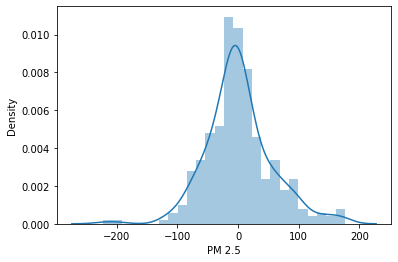

In [ ]:
pred = random_search.predict(X_test)
sns.distplot(y_test - pred)

In [ ]:
print('MAE > ', metrics.mean_absolute_error(y_test,pred))
print('MSE > ', metrics.mean_squared_error(y_test,pred))
print('RMSE > ', np.sqrt(metrics.mean_squared_error(y_test,pred)))

MAE >  39.54930837253183
MSE >  3006.659966120166
RMSE >  54.83301894041733


In [ ]:
print(f"R2 Score >> {np.round(metrics.r2_score(y_test,pred),3)*100} % ")

R2 Score >> 58.699999999999996 % 


> The Hypertuned Decision Tree model is giving <b> 56.8% </b> Accuracy

#### Exporting the Hypertuned Decision tree model

In [ ]:
import pickle
file = open('DTreeReg-model.pkl', 'wb')

pickle.dump(random_search, file)

# <center> KNN Regression </center>

In [ ]:
from sklearn.neighbors import KNeighborsRegressor
knn_reg = KNeighborsRegressor()

In [ ]:
knn_reg.fit(X_train,y_train)

KNeighborsRegressor()

In [ ]:
print(f'R^2 on train data > {knn_reg.score(X_train,y_train)}')
print(f'R^2 on test data > {knn_reg.score(X_test,y_test)}')   

R^2 on train data > 0.7187914046780861
R^2 on test data > 0.5418627199741388


In [ ]:
score = cross_val_score(knn_reg,X,y,cv=5)
print('score >', score.mean())

score > 0.4315907907186956


>KNN Regressor is giving 43% accuracy which is the worst, need to tune the hyper parameters

### Hyperparameter Tunning for KNN Regressor

In [ ]:
accuracy_scores = []

for i in range(1,40):
    knn_reg = KNeighborsRegressor(n_neighbors=i)
    score = cross_val_score(knn_reg,X,y,cv=5,scoring='neg_mean_squared_error')
    accuracy_scores.append(score.mean()) 

Text(0, 0.5, 'Accuracy Score')

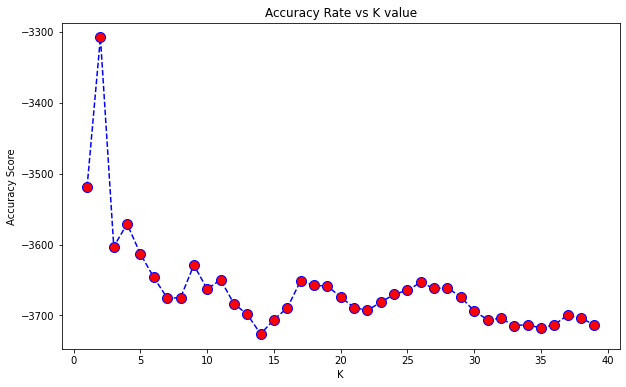

In [ ]:
plt.figure(figsize=(10,6))
plt.plot(range(1,40), accuracy_scores, color='blue', linestyle='dashed', marker='o', markerfacecolor='red', markersize=10)
plt.title("Accuracy Rate vs K value")
plt.xlabel("K")
plt.ylabel("Accuracy Score")

> Based on the Elbow method, we could get plot the Accuracy Rate vs K value to understand the best k value for the algorithm.
From the graph we could choose<b> k = 14 </b>

In [ ]:
knn_reg = KNeighborsRegressor(n_neighbors=14)
knn_reg.fit(X_train, y_train)

KNeighborsRegressor(n_neighbors=14)

In [ ]:
print(f'R^2 on train data > {knn_reg.score(X_train,y_train)}')
print(f'R^2 on test data > {knn_reg.score(X_test,y_test)}') 

R^2 on train data > 0.5977786209696536
R^2 on test data > 0.572565544239411


In [ ]:
score = cross_val_score(knn_reg,X,y,cv=5)
print('score >', score.mean())

score > 0.42740460999254876


#### Model Evaluation

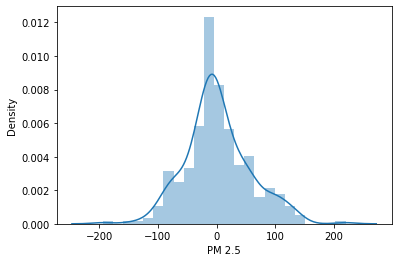

In [ ]:
pred = knn_reg.predict(X_test)
sns.distplot(y_test - pred)

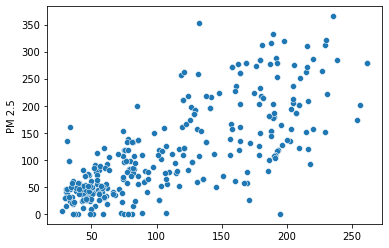

In [ ]:
sns.scatterplot(pred, y_test)

In [ ]:
from sklearn import metrics
print('MAE > ', metrics.mean_absolute_error(y_test,pred))
print('MSE > ', metrics.mean_squared_error(y_test,pred))
print('RMSE > ', np.sqrt(metrics.mean_squared_error(y_test,pred)))

MAE >  41.6197018365273
MSE >  3111.844137579082
RMSE >  55.783905721803684


In [ ]:
print(f"R2 Score >> {np.round(metrics.r2_score(y_test,pred),2)*100} % ")

R2 Score >> 56.99999999999999 % 


>The Hypertuned KNN regressor is giving <b> 47% </b> Accuracy

# <center> Random Forest Regression </center>

In [ ]:
from sklearn.ensemble import RandomForestRegressor

In [ ]:
randforest = RandomForestRegressor()
randforest.fit(X_train, y_train)

RandomForestRegressor()

In [ ]:
print(f'R^2 on train data > {randforest.score(X_train,y_train)}')
print(f'R^2 on test data > {randforest.score(X_test,y_test)}')

R^2 on train data > 0.976849826322047
R^2 on test data > 0.8088235241703088


In [ ]:
score = cross_val_score(randforest,X,y,cv=5)
print('score >', score.mean())

score > 0.7349301877839861


>Random Forest Regressor is giving 73% accuracy which is best score till now

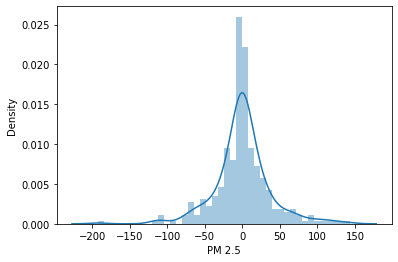

In [ ]:
forest_pred = randforest.predict(X_test)
sns.distplot(y_test - forest_pred)

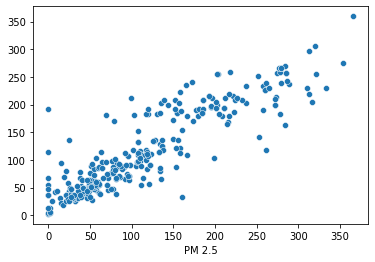

In [ ]:
sns.scatterplot(y_test, forest_pred)

### Hyperparameter Tuning for Random Forest Regressor

In [ ]:
rf = RandomForestRegressor()

In [ ]:
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start=100, stop=1200, num=12)]

#Number of feature to consider at each split
max_features= ['auto','sqrt']

#max number of levels in a tree
max_depth = [int(x) for x in np.linspace(5,30, num=6)]

#min number of samples required at each leaf node
min_samples_leaf = [1,2,5,10]

#min number ofsamples required to split a node
min_samples_split = [2,5,10,15,100]

bootstrap = [True, False]

In [ ]:
rand_forst_para = {
    'n_estimators' : n_estimators,
    'max_features': max_features,
    'max_depth':max_depth,
    'min_samples_leaf':min_samples_leaf,
    'min_samples_split':min_samples_split,
    'bootstrap':bootstrap
}

In [ ]:
from sklearn.model_selection import RandomizedSearchCV
rf_random = RandomizedSearchCV(estimator=rf , param_distributions=rand_forst_para, scoring='neg_mean_squared_error', n_iter=100, cv = 5,verbose=2, random_state=42)

In [ ]:
rf_random.fit(X_train,y_train)

Fitting 5 folds for each of 100 candidates, totalling 500 fits
[CV] END bootstrap=False, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=300; total time=   1.2s
[CV] END bootstrap=False, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=300; total time=   1.2s
[CV] END bootstrap=False, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=300; total time=   1.2s
[CV] END bootstrap=False, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=300; total time=   1.2s
[CV] END bootstrap=False, max_depth=20, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=300; total time=   1.2s
[CV] END bootstrap=False, max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=900; total time=   1.7s
[CV] END bootstrap=False, max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=90

RandomizedSearchCV(cv=5, estimator=RandomForestRegressor(), n_iter=100,
                   param_distributions={'bootstrap': [True, False],
                                        'max_depth': [5, 10, 15, 20, 25, 30],
                                        'max_features': ['auto', 'sqrt'],
                                        'min_samples_leaf': [1, 2, 5, 10],
                                        'min_samples_split': [2, 5, 10, 15,
                                                              100],
                                        'n_estimators': [100, 200, 300, 400,
                                                         500, 600, 700, 800,
                                                         900, 1000, 1100,
                                                         1200]},
                   random_state=42, scoring='neg_mean_squared_error',
                   verbose=2)

In [ ]:
rf_random.best_params_

{'bootstrap': False,
 'max_depth': 25,
 'max_features': 'sqrt',
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'n_estimators': 700}

In [ ]:
rf_random.best_score_

-1543.4303742975742

#### Model Evaluation

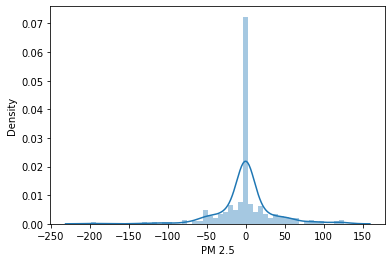

In [ ]:
rfpred = rf_random.predict(X_test)
sns.distplot(y_test - rfpred)

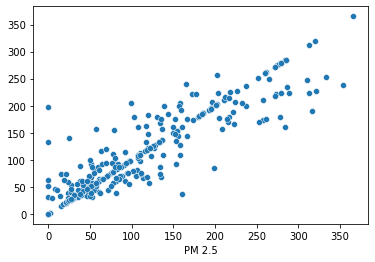

In [ ]:
sns.scatterplot(y_test, rfpred)

In [ ]:
print('MAE > ', metrics.mean_absolute_error(y_test,rfpred))
print('MSE > ', metrics.mean_squared_error(y_test,rfpred))
print('RMSE > ', np.sqrt(metrics.mean_squared_error(y_test,rfpred)))

MAE >  19.256155486076768
MSE >  1218.8346569368716
RMSE >  34.911812570201384


In [ ]:
print(f"R2 Score >> {np.round(metrics.r2_score(y_test,rfpred),2)*100} % ")

R2 Score >> 83.0 % 


> The Hypertuned Random Forest model is giving <b>83%</b> Accuracy

#### Exporting the Hypertuned Random Forest model

In [ ]:
import pickle
file = open('RandomForestReg-model.pkl', 'wb')

pickle.dump(rf_random, file)

# <center> XGBoost Regression </center>

In [119]:
import xgboost as xgb

In [120]:
xgb_reg = xgb.XGBRegressor()
xgb_reg.fit(X_train, y_train)

[10:12:25] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


XGBRegressor()

In [121]:
print(f'R^2 on train data > {xgb_reg.score(X_train,y_train)}')
print(f'R^2 on test data > {xgb_reg.score(X_test,y_test)}') 

R^2 on train data > 0.8541357167988102
R^2 on test data > 0.7320339106432086


In [122]:
score = cross_val_score(xgb_reg,X,y,cv=5)
print('score >', score.mean())

[10:12:26] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[10:12:26] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[10:12:26] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[10:12:26] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[10:12:26] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
score > 0.6582827367763413


>The XGboost is giving us 65% Accuracy, can imporve its performanance with hyperparameter tuning

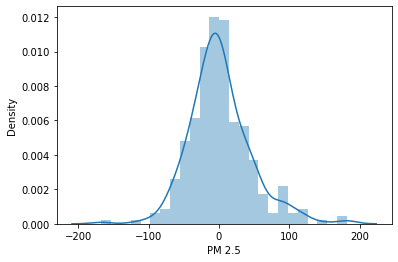

In [123]:
y_pred = xgb_reg.predict(X_test)
sns.distplot(y_test - y_pred)

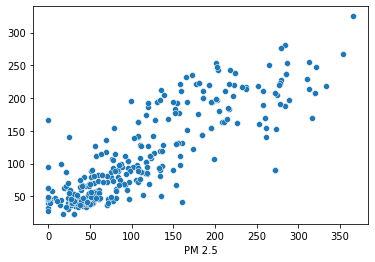

In [124]:
sns.scatterplot(y_test, y_pred)

### Hyperparameter tuning for XGboost

In [125]:
reg = xgb.XGBRegressor()
from sklearn.model_selection import RandomizedSearchCV

In [126]:
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start=100, stop=1200, num=12)]

#Learning rate parameters
learning_rate = ['0.05','0.1','0.2','0.3','0.5','0.6']

#max number of levels in a tree
max_depth = [int(x) for x in np.linspace(5,30, num=6)]

#subsample parameter values
subsample = [0.3,0.6,0.8]

#min child weight parameters
min_child_weight=[3,4,5,6,7]

In [127]:
random_param = {
    'n_estimators':n_estimators,
    'learning_rate':learning_rate,
    'max_depth':max_depth,
    'subsample':subsample,
    'min_child_weight':min_child_weight
}

In [128]:
random_xg = RandomizedSearchCV(estimator = reg, param_distributions = random_param,n_iter=100, scoring = 'neg_mean_squared_error', n_jobs=1, random_state=42 )

In [129]:
random_xg.fit(X_train,y_train)

[10:12:26] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[10:12:27] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[10:12:28] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[10:12:29] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[10:12:30] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[10:12:31] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[10:12:32] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[10:12:33] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of re

RandomizedSearchCV(estimator=XGBRegressor(), n_iter=100, n_jobs=1,
                   param_distributions={'learning_rate': ['0.05', '0.1', '0.2',
                                                          '0.3', '0.5', '0.6'],
                                        'max_depth': [5, 10, 15, 20, 25, 30],
                                        'min_child_weight': [3, 4, 5, 6, 7],
                                        'n_estimators': [100, 200, 300, 400,
                                                         500, 600, 700, 800,
                                                         900, 1000, 1100,
                                                         1200],
                                        'subsample': [0.3, 0.6, 0.8]},
                   random_state=42, scoring='neg_mean_squared_error')

In [130]:
random_xg.best_params_

{'learning_rate': '0.05',
 'max_depth': 30,
 'min_child_weight': 5,
 'n_estimators': 400,
 'subsample': 0.6}

In [131]:
random_xg.best_score_

-1561.5995825543034

#### Model Evaluation

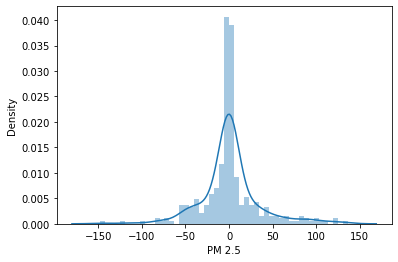

In [132]:
xg_pred = random_xg.predict(X_test)
sns.distplot(y_test - xg_pred)

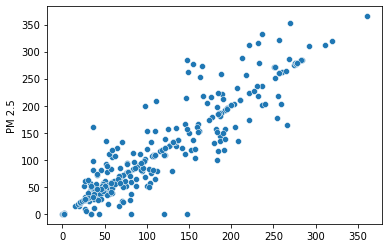

In [133]:
sns.scatterplot(xg_pred, y_test)

In [134]:
from sklearn import metrics
print('MAE > ', metrics.mean_absolute_error(y_test,xg_pred))
print('MSE > ', metrics.mean_squared_error(y_test,xg_pred))
print('RMSE > ', np.sqrt(metrics.mean_squared_error(y_test,xg_pred)))

MAE >  19.811400747474856
MSE >  1157.858885566426
RMSE >  34.02732557175815


In [135]:
print(f"R2 Score >> {np.round(metrics.r2_score(y_test,y_pred),1)*100} % ")

R2 Score >> 70.0 % 


#### Exporting the Hypertuned XGBoost model

In [136]:
import pickle
file = open('XGBoostReg-model.pkl', 'wb')
pickle.dump(random_xg, file)

> Neural networks are mainly used for very large dataset and also consumes more power. As we could achive great accuracy with ML models we can go forward with it. 
Implementing for experimental purpose

# <center> ANN Artificial Neural Network </center> 

In [137]:
import keras
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LeakyReLU, PReLU, ELU
from keras.layers import Dropout 

In [138]:
NN_model = Sequential()

# Input Layer:
NN_model.add(Dense(128, kernel_initializer='normal', input_dim=X_train.shape[1]))

# Hidden Layers:
NN_model.add(Dense(256, kernel_initializer='normal', activation='relu'))
NN_model.add(Dense(256, kernel_initializer='normal', activation='relu'))
NN_model.add(Dense(256, kernel_initializer='normal', activation='relu'))

# Output Layer:
NN_model.add(Dense(1, kernel_initializer='normal', activation='linear'))

# Compile the Network:
NN_model.compile(loss='mean_absolute_error', optimizer='adam', metrics=['mean_absolute_error'])
NN_model.summary()

# Fitting the ANN to the training set
model_history = NN_model.fit(X_train, y_train, validation_split=0.33, batch_size=10, epochs = 100)

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 128)               1152      
                                                                 
 dense_1 (Dense)             (None, 256)               33024     
                                                                 
 dense_2 (Dense)             (None, 256)               65792     
                                                                 
 dense_3 (Dense)             (None, 256)               65792     
                                                                 
 dense_4 (Dense)             (None, 1)                 257       
                                                                 
Total params: 166,017
Trainable params: 166,017
Non-trainable params: 0
_________________________________________________________________
Epoch 1/100
52/52 [==============================]

####  Model Evaluation

In [139]:
ann_pred = NN_model.predict(X_test)
# sns.distplot(y_test - xg_pred)
ann_pred.shape

(328, 1)

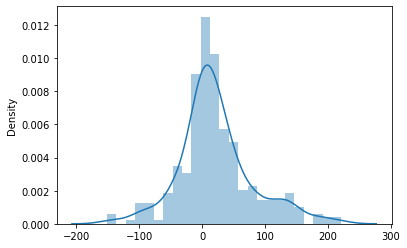

In [140]:
sns.distplot(y_test.values.reshape(-1,1) - ann_pred)